In [81]:
import pandas as pd 
df = pd.read_csv('https://raw.githubusercontent.com/NickQin001/data-bootcamp/main/netflix_titles.csv')
df

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmmaker Kirsten Johnson stages his death in inventive and comical ways to help them both face the inevitable."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town teen sets out to prove whether a private-school swimming star is her sister who was abducted at birth."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Action & Adventure","To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war."
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down among the incarcerated women at the Orleans Justice Center in New Orleans on this gritty reality series."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam Khan, Ahsaas Channa, Revathi Pillai, Urvi Singh, Arun Kumar",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV Comedies","In a city of coaching centers known to train India’s finest collegiate minds, an earnest but unexceptional student and his friends navigate campus life."
...,...,...,...,...,...,...,...,...,...,...,...,...
8802,s8803,Movie,Zodiac,David Fincher,"Mark Ruffalo, Jake Gyllenhaal, Robert Downey Jr., Anthony Edwards, Brian Cox, Elias Koteas, Donal Logue, John Carroll Lynch, Dermot Mulroney, Chloë Sevigny",United States,"November 20, 2019",2007,R,158 min,"Cult Movies, Dramas, Thrillers","A political cartoonist, a crime reporter and a pair of cops investigate San Francisco's infamous Zodiac Killer in this thriller based on a true story."
8803,s8804,TV Show,Zombie Dumb,NaN,NaN,NaN,"July 1, 2019",2018,TV-Y7,2 Seasons,"Kids' TV, Korean TV Shows, TV Comedies","While living alone in a spooky town, a young girl befriends a motley crew of zombie children with diverse personalities."
8804,s8805,Movie,Zombieland,Ruben Fleischer,"Jesse Eisenberg, Woody Harrelson, Emma Stone, Abigail Breslin, Amber Heard, Bill Murray, Derek Graf",United States,"November 1, 2019",2009,R,88 min,"Comedies, Horror Movies","Looking to survive in a world taken over by zombies, a dorky college student teams with an urban roughneck and a pair of grifter sisters."
8805,s8806,Movie,Zoom,Peter Hewitt,"Tim Allen, Courteney Cox, Chevy Chase, Kate Mara, Ryan Newman, Michael Cassidy, Spencer Breslin, Rip Torn, Kevin Zegers",United States,"January 11, 2020",2006,PG,88 min,"Children & Family Movies, Comedies","Dragged from civilian life, a former superhero must train a new crop of youthful saviors when the military preps for an attack by a familiar villain."


In [82]:
# Shows the total rows, name and number of columns and their datatypes
# There are some null values in the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8807 non-null   object
 1   type          8807 non-null   object
 2   title         8807 non-null   object
 3   director      6173 non-null   object
 4   cast          7982 non-null   object
 5   country       7976 non-null   object
 6   date_added    8797 non-null   object
 7   release_year  8807 non-null   int64 
 8   rating        8803 non-null   object
 9   duration      8804 non-null   object
 10  listed_in     8807 non-null   object
 11  description   8807 non-null   object
dtypes: int64(1), object(11)
memory usage: 825.8+ KB


In [83]:
# Define a function to calculate missing values and their percentage for each column
def missing_pct(df):
    # Calculate percentage of missing values for each column
    missing_count_percent = df.isnull().sum() * 100 / df.shape[0]
    
    # Create a new DataFrame to store the missing percentage for each column, rounding to two decimal places
    df_missing_count_percent = pd.DataFrame(missing_count_percent).round(2)
    # Reset the index of the DataFrame and rename the columns to be more descriptive
    df_missing_count_percent = df_missing_count_percent.reset_index().rename(
        columns={
            'index':'Column',
            0:'Missing_Percentage (%)'
        }
    )
    
    # Create a new DataFrame to store the count of missing values for each column
    df_missing_value = df.isnull().sum()
    # Reset the index of the DataFrame and rename the columns to be more descriptive
    df_missing_value = df_missing_value.reset_index().rename(
        columns={
            'index':'Column',
            0:'Missing_value_count'
        }
    )
    
    # Merge the two DataFrames using the 'Column' column as the key, and sort by missing percentage in descending order
    Final = df_missing_value.merge(df_missing_count_percent, how = 'inner', left_on = 'Column', right_on = 'Column')
    Final = Final.sort_values(by = 'Missing_Percentage (%)',ascending = False)
    
    # Return the final DataFrame with missing value counts and percentages for each column
    return Final

# Call the function with a pandas DataFrame as input
missing_pct(df)


,Column,Missing_value_count,Missing_Percentage (%)
3,director,2634,29.91
5,country,831,9.44
4,cast,825,9.37
6,date_added,10,0.11
8,rating,4,0.05
9,duration,3,0.03
0,show_id,0,0.00
1,type,0,0.00
2,title,0,0.00
7,release_year,0,0.00


<!-- A better way to get information of a dataset -->
<!-- speaking notes -->
ProfileReport is a function from the Python package Pandas-Profiling that generates an exploratory data analysis report for a given dataset. The report provides a comprehensive summary of the dataset's statistics, distribution, missing values, and correlations between features.

Here are some of the things that ProfileReport can do:

1. Data summary: ProfileReport provides a summary of the dataset's size, number of variables, and data types. It also displays the first and last few rows of the data.

2. Variable types: ProfileReport identifies the data type of each variable in the dataset, such as numeric, categorical, or date.

3. Descriptive statistics: ProfileReport provides descriptive statistics for each variable, such as the mean, median, standard deviation, and percentiles. It also displays the skewness and kurtosis of the distribution.

4. Missing values: ProfileReport identifies missing values in the dataset and displays the number and percentage of missing values for each variable.

5. Correlations: ProfileReport computes the pairwise correlation between the variables and displays them in a heatmap.

6. Visualizations: ProfileReport generates various visualizations, such as histograms, box plots, and scatter plots, to help visualize the distribution and relationships between variables.

Overall, ProfileReport provides a quick and easy way to explore and understand a dataset, making it a valuable tool for data analysis and preprocessing.

In [84]:
from pandas_profiling import ProfileReport
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Handling the missing data and incorrect data

In [85]:
list(df['rating'].unique())

['PG-13',
 'TV-MA',
 'PG',
 'TV-14',
 'TV-PG',
 'TV-Y',
 'TV-Y7',
 'R',
 'TV-G',
 'G',
 'NC-17',
 '74 min',
 '84 min',
 '66 min',
 'NR',
 nan,
 'TV-Y7-FV',
 'UR']

In [86]:
# Rating data is mentioned incorrectly for few rows in the input file. Hence correcting it by checking the Maturity rating online
df['rating'] = df['rating'].replace({'74 min': 'TV-MA', '84 min': 'TV-MA', '66 min': 'TV-MA'})
df['rating'] = df['rating'].replace({'TV-Y7-FV': 'TV-Y7'})

In [87]:
list(df['rating'].unique())

['PG-13',
 'TV-MA',
 'PG',
 'TV-14',
 'TV-PG',
 'TV-Y',
 'TV-Y7',
 'R',
 'TV-G',
 'G',
 'NC-17',
 'NR',
 nan,
 'UR']

source for netflix standards: https://help.netflix.com/en/node/2064

'NR' OR 'UR':
If a film has not been submitted for a rating or is an uncut version of a film that was submitted, the labels Not Rated (NR) or Unrated (UR) are often used.

In [88]:
# Renaming and Categorizing vaules for Rating for better understanding
df['rating'] = df['rating'].replace({
                'PG-13': 'Teens - Age above 13',
                'TV-MA': 'Adults',
                'PG': 'Kids - with parental guidence',
                'TV-14': 'Teens - Age above 14',
                'TV-PG': 'Kids - with parental guidence',
                'TV-Y': 'Kids',
                'TV-Y7': 'Kids - Age above 7',
                'R': 'Adults',
                'TV-G': 'Kids',
                 'G': 'Kids',
                'NC-17': 'Adults',
                'NR': 'Not Rated',
                'UR' : 'Unrated'
                
})

In [89]:
import numpy as np 
# Fill missing values in 'country' column with the mode (most frequent value)
df['country'] = df['country'].fillna(df['country'].mode()[0])

# Replace missing values in 'cast' and 'director' columns with 'No Data Found'
df['cast'].replace(np.nan, 'No Data Found', inplace=True)
df['director'].replace(np.nan, 'No Data Found', inplace=True)

# Drop rows with any missing values
df.dropna(inplace=True)

# Drop duplicate rows
df.drop_duplicates(inplace=True)


Analyzing data

In [90]:
# Select only the relevant columns from the original dataframe
df_genre = df[['show_id', 'title','type', 'listed_in' ]]

# Split the 'listed_in' column by commas and stack the resulting values into separate rows
df_genre = (df_genre.drop('listed_in', axis=1).join
            (df_genre.listed_in.str.split(', ', expand=True).stack().reset_index(drop=True, level=1).rename('listed_in'))
           )

In [91]:
df['month_added'] = pd.DatetimeIndex(df['date_added']).month

In [92]:
# Total Shows and movies
df_count = df['show_id'].count().sum()
print(df_count)
# Split of showes and TV
df_type = df.groupby('type')['show_id'].count().reset_index()
df_type = df_type.rename(columns = {"show_id":"count_showids"})

8790


In [93]:
df_genre


,show_id,title,type,listed_in
0,s1,Dick Johnson Is Dead,Movie,Documentaries
1,s2,Blood & Water,TV Show,International TV Shows
1,s2,Blood & Water,TV Show,TV Dramas
1,s2,Blood & Water,TV Show,TV Mysteries
2,s3,Ganglands,TV Show,Crime TV Shows
...,...,...,...,...
8805,s8806,Zoom,Movie,Children & Family Movies
8805,s8806,Zoom,Movie,Comedies
8806,s8807,Zubaan,Movie,Dramas
8806,s8807,Zubaan,Movie,International Movies


In [94]:
df_genre_viz = df_genre[["title", "type", "listed_in"]]

# Group the "df_genre_viz" DataFrame by "listed_in" and "type", counts the number of movies for each group, and sorts the result by the "title" column
df_genre_viz = df_genre_viz.groupby(['listed_in', 'type'])["title"].count().reset_index().sort_values('title')

# rename the columns
df_genre_viz = df_genre_viz.rename(columns = {"title": "movies_count", "listed_in": "Genre"})

# Filter the "df_genre_viz" DataFrame by the "type" column for "Movie" and assigns it to "df_genre_movie" 
df_genre_movie = df_genre_viz.query("type == 'Movie'")

# Filter the "df_genre_viz" DataFrame by the "type" column for "TV Show" and assigns it to "df_genre_tvshow"
df_genre_tvshow = df_genre_viz.query("type == 'TV Show'")


In [95]:
import plotly.express as px
#  Find out genre that has the highest amount of content (movies) uploaded?
'''
The df_genre_movie DataFrame is used as the data source, 
'movies_count' is used as the x-axis, 'Genre' is used as the y-axis
color_discrete_sequence is used to specify the color scheme for the bars
'''

fig1 = px.bar(df_genre_movie, x='movies_count', y='Genre', color_discrete_sequence=px.colors.sequential.RdBu,
       title='What genre has the highest amount of content (movies) uploaded? ', height=600)

fig1.show() 

In [96]:
#  Find out genre that has the highest amount of content (TV shows) uploaded

'''
The df_genre_tvshow DataFrame is used as the data source
'Genre' is used as the x-axis, 'movies_count' is used as the y-axis
 'Red' is used as the color for the bars.
 '''
# Assigning 'Genre' to the x-axis and 'movies_count' to the y-axis would also be a suitable choice in this scenario.

fig2 = px.bar(df_genre_tvshow, x='Genre', y='movies_count', color_discrete_sequence=['Red'],
       title='Which genre has the highest amount of content (TV shows) uploaded? ')

fig2.show()

An alternative approach to displaying the plots is by arranging two plots side by side to facilitate comparison.

In [97]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
'''
Create a grid of subplots with one row and two columns. 
The specs argument specifies that each column should contain a bar chart. 
The subplot_titles argument sets the titles for each subplot, and horizontal_spacing sets the distance between the subplots.
'''
fig3 = make_subplots(rows=1, cols=2, specs=[[{'type':'bar'}, {'type':'bar'}]],
                     subplot_titles=['Which genre has the highest number of uploaded movies?', 
                                      'Which genre has the highest number of uploaded TV shows?'],
                     horizontal_spacing=0.3)

# Add the first bar chart to the subplot grid
fig3.add_trace(
    go.Bar(x=df_genre_movie['movies_count'], y=df_genre_movie['Genre'], orientation='h', 
           marker_color='Maroon', name="Movie", text=df_type['count_showids'], textposition='auto'),
    row=1, col=1
)

# Add the second bar chart to the subplot grid
fig3.add_trace(
    go.Bar(x=df_genre_tvshow['movies_count'], y=df_genre_tvshow['Genre'], orientation='h', 
           marker_color='Grey', name="TV Show"),
    row=1, col=2
)

# Set the height of the subplot grid
fig3.update_layout(height=600)

# Display the subplot grid
fig3.show()

In [98]:
# Find out the top 5 countries for Netflix viewers
# The number 198 was chosen based on the result of ProfileReport. 
'''
# If we don't have the ProfileReport result, we can use nlargest() fuinction:
# nlargest() is a pandas method that is used to select the top n values from a Series or DataFrame based on a given column.
target = 'country'
top_n = 5

top_n_countries = df[target].value_counts().nlargest(top_n).index.tolist()
'''
target = 'country'
top5countries = df[target].value_counts()[df[target].value_counts()>198].index.tolist()
top5countries

['United States', 'India', 'United Kingdom', 'Japan', 'South Korea']

In [99]:
# Filter the data that within those top 5 countries
dfte = df.loc[df[target].isin(top5countries)]
print(dfte.shape)
dfte.head()

(5470, 13)


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month_added
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,No Data Found,United States,"September 25, 2021",2020,Teens - Age above 13,90 min,Documentaries,"As her father nears the end of his life, filmmaker Kirsten Johnson stages his death in inventive and comical ways to help them both face the inevitable.",9
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",United States,"September 24, 2021",2021,Adults,1 Season,"Crime TV Shows, International TV Shows, TV Action & Adventure","To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war.",9
3,s4,TV Show,Jailbirds New Orleans,No Data Found,No Data Found,United States,"September 24, 2021",2021,Adults,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down among the incarcerated women at the Orleans Justice Center in New Orleans on this gritty reality series.",9
4,s5,TV Show,Kota Factory,No Data Found,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam Khan, Ahsaas Channa, Revathi Pillai, Urvi Singh, Arun Kumar",India,"September 24, 2021",2021,Adults,2 Seasons,"International TV Shows, Romantic TV Shows, TV Comedies","In a city of coaching centers known to train India’s finest collegiate minds, an earnest but unexceptional student and his friends navigate campus life.",9
5,s6,TV Show,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, Henry Thomas, Kristin Lehman, Samantha Sloyan, Igby Rigney, Rahul Kohli, Annarah Cymone, Annabeth Gish, Alex Essoe, Rahul Abburi, Matt Biedel, Michael Trucco, Crystal Balint, Louis Oliver",United States,"September 24, 2021",2021,Adults,1 Season,"TV Dramas, TV Horror, TV Mysteries","The arrival of a charismatic young priest brings glorious miracles, ominous mysteries and renewed religious fervor to a dying town desperate to believe.",9


In [100]:
dfte['duration'].value_counts()

1 Season     1185
2 Seasons     264
3 Seasons     126
90 min         90
97 min         87
             ... 
21 min          1
203 min         1
212 min         1
9 min           1
191 min         1
Name: duration, Length: 204, dtype: int64

In [101]:
# Filter a Pandas DataFrame dfte to only include rows where the 'duration' column contains the string 'Season' and then counts the occurrences of each unique value in the resulting series.
dfte.loc[dfte['duration'].str.contains('Season').fillna(False).values]['duration'].value_counts()

1 Season      1185
2 Seasons      264
3 Seasons      126
4 Seasons       62
5 Seasons       46
6 Seasons       28
7 Seasons       17
8 Seasons       15
9 Seasons        9
10 Seasons       4
17 Seasons       1
13 Seasons       1
15 Seasons       1
11 Seasons       1
Name: duration, dtype: int64

In [102]:
# Change all seasons into 13 episodes of 60 mins each (on average)
    # Fill missing values in the 'duration' column with the string "1 min"
         #  Map the values of the 'duration' column
              # If the value contains string 'season'
              # Then take the first two characters of the string,
              # Convert it to an integer, multiply it by 780 (13*60min), and append the string 'min' to the result
              # Otherwise leave the value unchanged

dfte['duration'] = dfte['duration'].fillna("1 min").map(lambda x: str(780*int(x.split(" ")[0][:2]))+" min" if 'season' in x.lower() else x).values
dfte['duration']

print(dfte['duration'].head(30))

0       90 min
2      780 min
3      780 min
4     1560 min
5      780 min
6       91 min
8     7020 min
9      104 min
10     780 min
11     780 min
13      91 min
14     780 min
15    3120 min
16      67 min
18      94 min
19     780 min
20     780 min
22     161 min
23      61 min
24     166 min
26     147 min
27     103 min
28      97 min
30     111 min
31     780 min
32    2340 min
33     780 min
34     780 min
35     110 min
36     105 min
Name: duration, dtype: object


In [103]:
# Split the value on the space character and takes the first element (i.e. the numeric part), converts it to a float
dfte['duration'] =  dfte['duration'].map(lambda x: float(x.split(" ")[0]))

print(dfte['duration'].head(30))

0       90.0
2      780.0
3      780.0
4     1560.0
5      780.0
6       91.0
8     7020.0
9      104.0
10     780.0
11     780.0
13      91.0
14     780.0
15    3120.0
16      67.0
18      94.0
19     780.0
20     780.0
22     161.0
23      61.0
24     166.0
26     147.0
27     103.0
28      97.0
30     111.0
31     780.0
32    2340.0
33     780.0
34     780.0
35     110.0
36     105.0
Name: duration, dtype: float64


In [104]:
!pip install autoviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [105]:
# An amazing package that can automatically generate plots
from autoviz.AutoViz_Class import AutoViz_Class

In [106]:
%matplotlib inline

My insight on a variety of visualizations I got from AutoViz() method:

We can generate histograms or density plots using AutoViz_Class() to visualize the distribution of duration of Netflix content. This can give us an idea of the most common durations of shows and movies on Netflix. AutoViz_Class() automatically chooses the most appropriate type of plot based on the input data.

We can also generate bar plots or pie charts to show the proportion of viewers from the top 5 countries using AutoViz_Class(). This can help us understand the popularity of Netflix across different countries and identify which countries have the highest number of viewers. AutoViz_Class() can also create stacked bar charts or grouped bar charts to compare the viewership across countries for different categories or genres of content.

For geographic analysis, we can use AutoViz_Class() to generate heatmaps or geographic plots to show the distribution of viewers across countries. Heatmaps can help us identify which countries have the highest concentration of Netflix viewers, while geographic plots can help us visualize the spatial distribution of viewership. AutoViz_Class() selects the appropriate library, such as Seaborn or Plotly, to create these plots based on the input data.

Furthermore, we can generate scatter plots or line charts to explore the relationship between duration and viewership across countries or over time. This can help us identify any patterns or trends in the data, such as whether longer shows or movies tend to have higher viewership. AutoViz_Class() can also create regression plots to visualize any linear relationship between the variables.

By generating these visualizations using AutoViz_Class(), we can quickly gain insights into our Netflix data and identify any interesting patterns or relationships. Additionally, we can use these visualizations to communicate our findings to others and make data-driven decisions.

Shape of your Data Set loaded: (5470, 13)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
show_id,5470,object,0,0.000000,100.000000,1,"combine rare categories, possible ID column: drop"
title,5470,object,0,0.000000,100.000000,1,"combine rare categories, possible ID column: drop"
description,5444,object,0,0.000000,99.524680,1,combine rare categories
cast,4648,object,0,0.000000,84.972578,1,combine rare categories
director,2781,object,0,0.000000,50.840951,1,combine rare categories
date_added,1496,object,0,0.000000,27.349177,1,combine rare categories
listed_in,454,object,0,0.000000,8.299817,1,combine rare categories
duration,204,float64,0,0.000000,3.729433,0,skewed: cap or drop outliers
release_year,72,int64,0,0.000000,1.316271,0,
month_added,12,int64,0,0.000000,0.219378,0,


    12 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['show_id']

################ Multi_Classification problem #####################


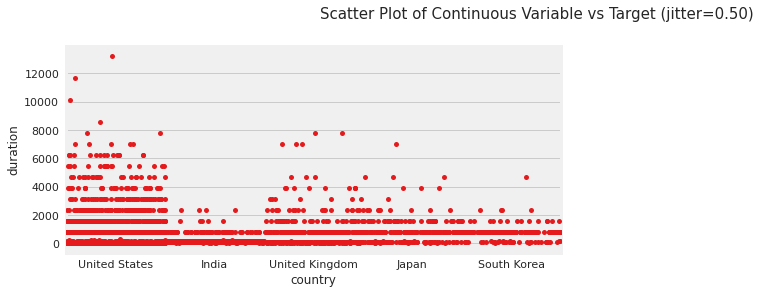

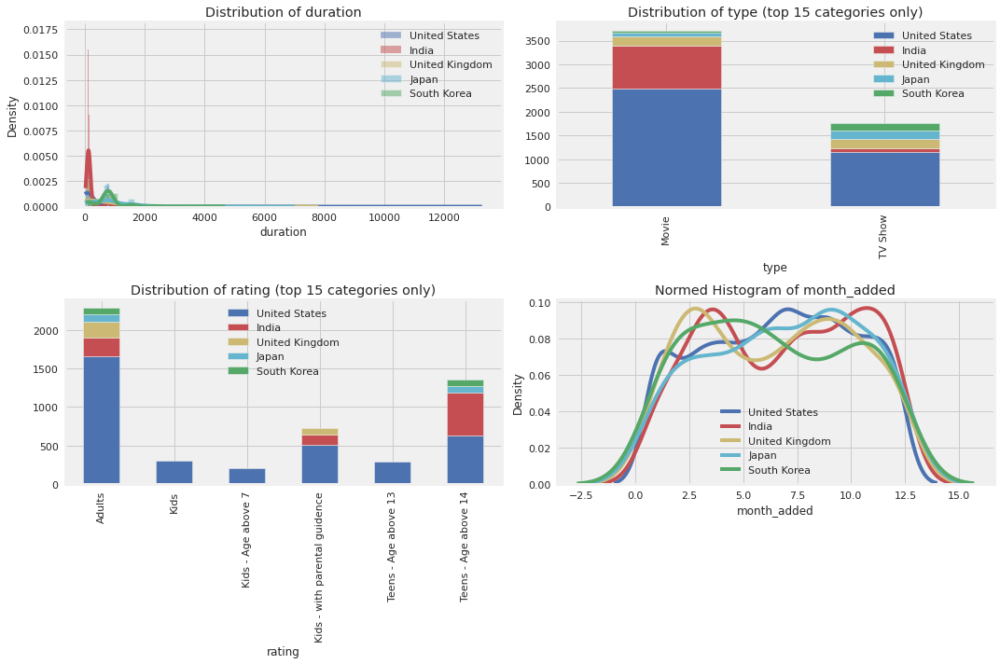

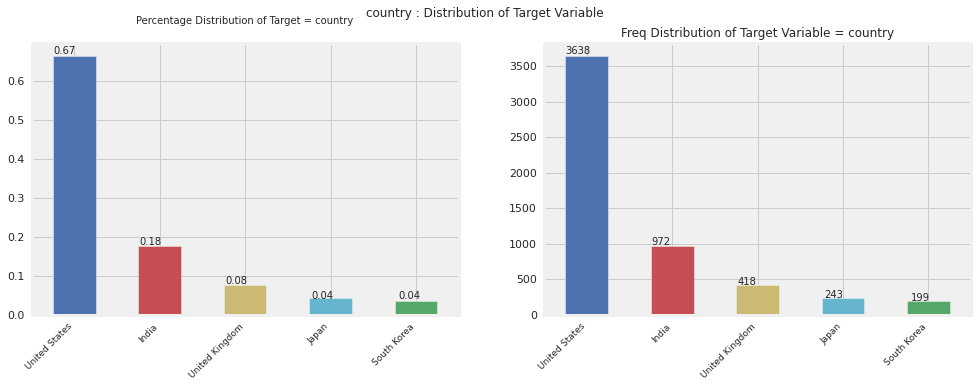

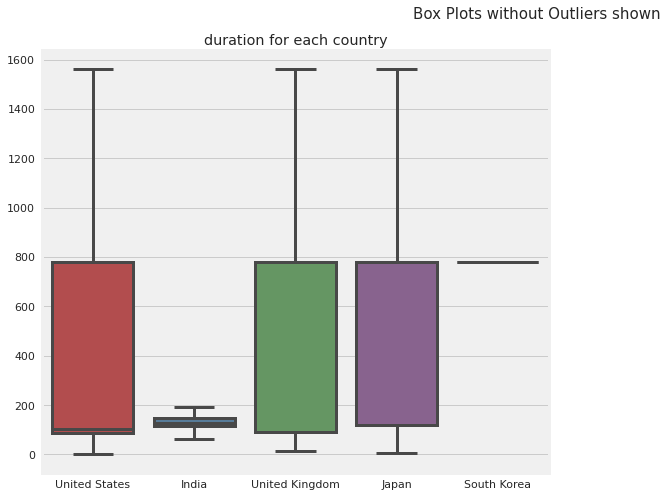

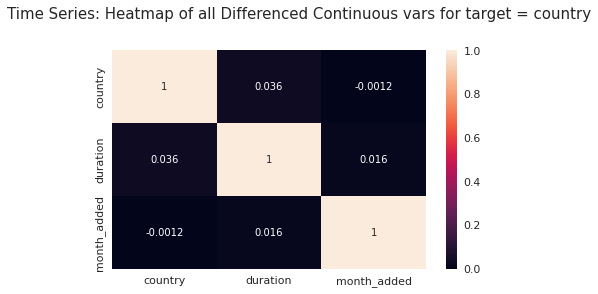

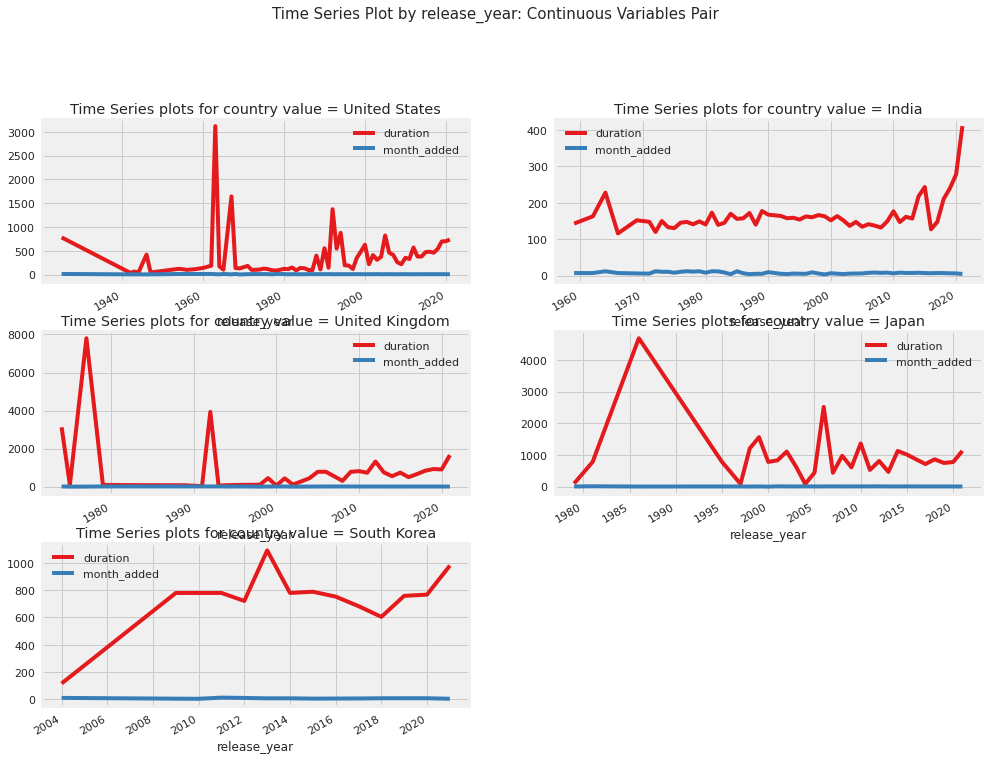

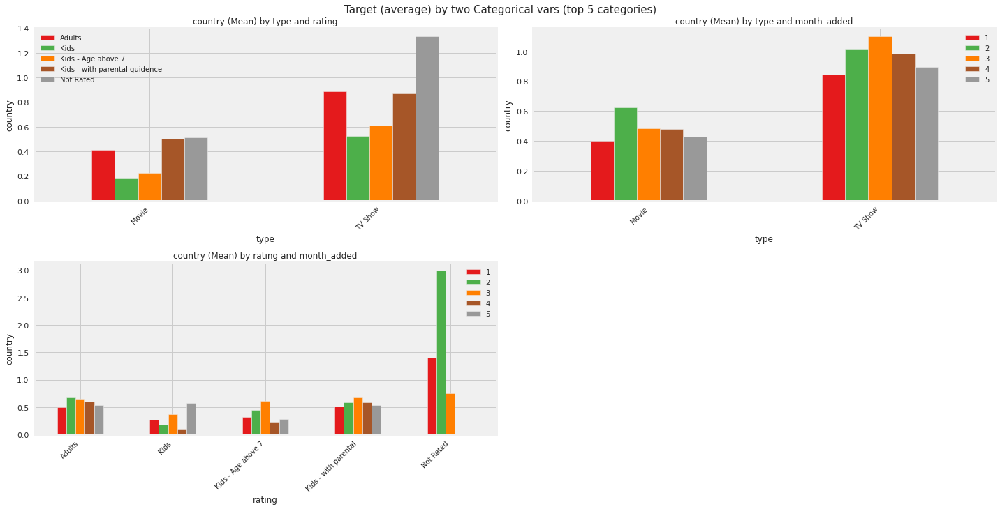

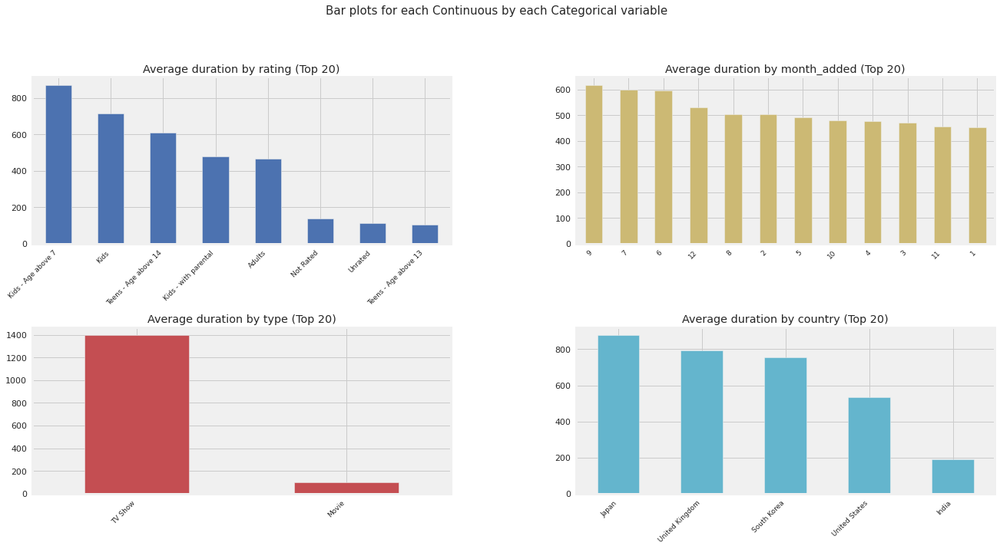

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

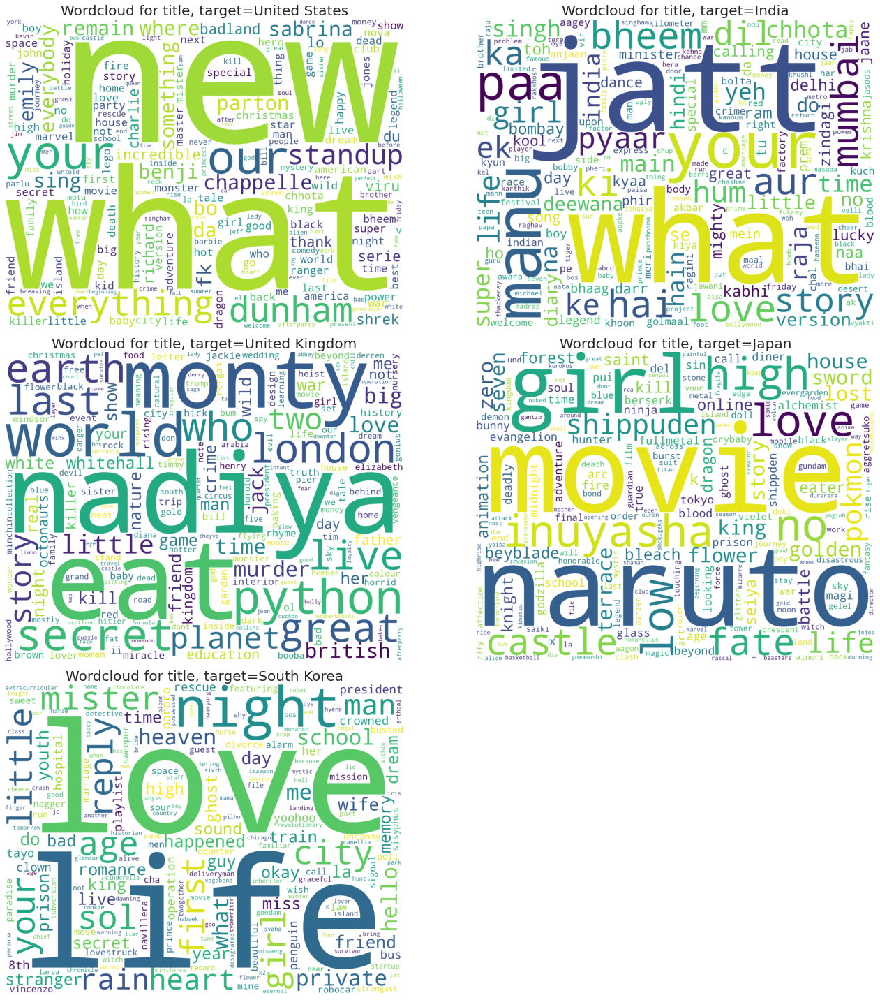

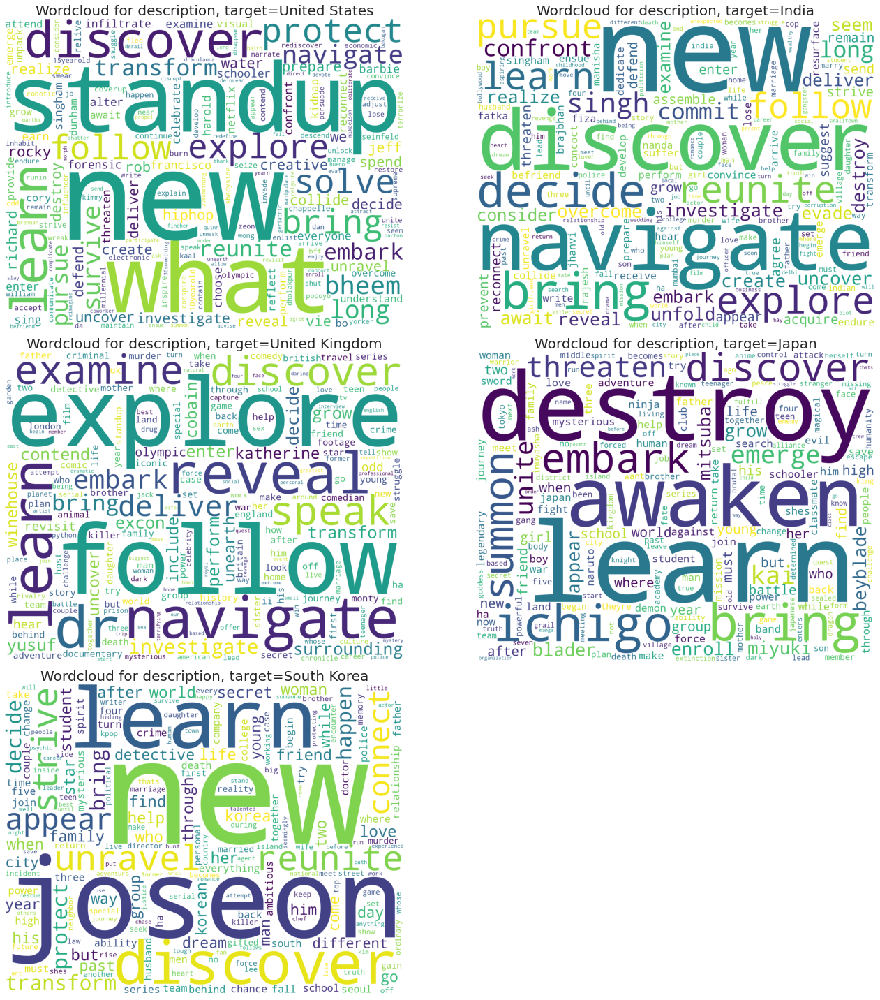

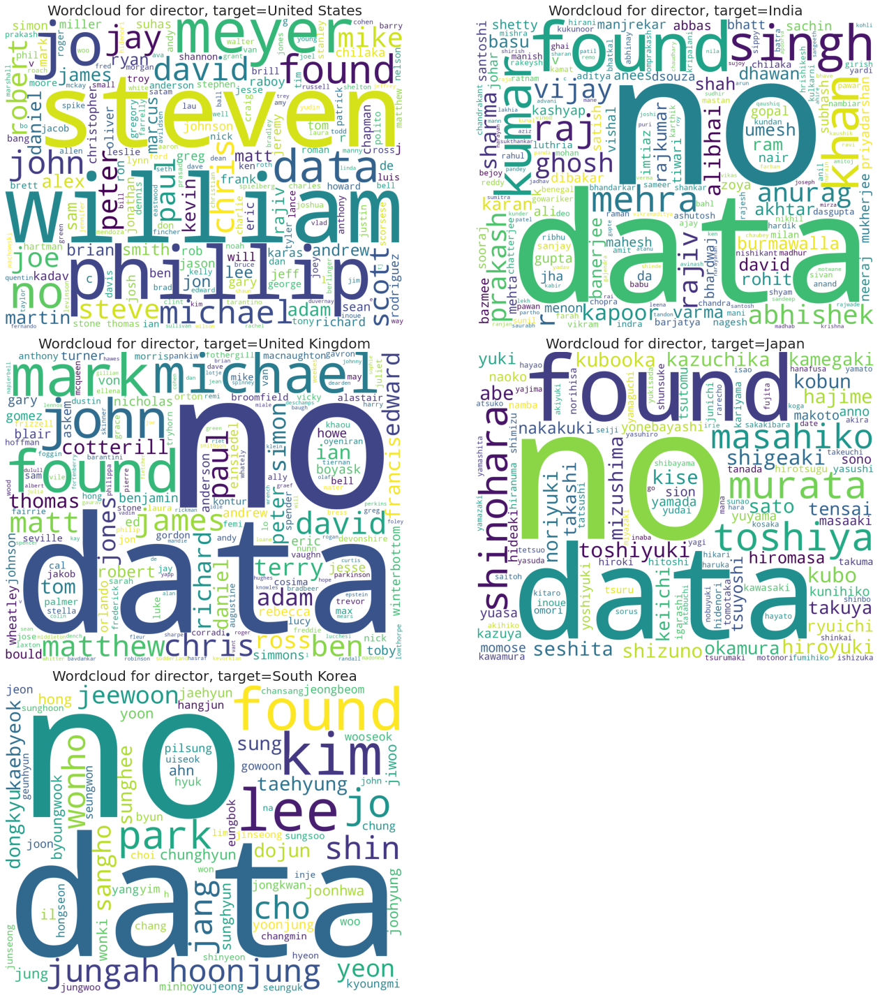

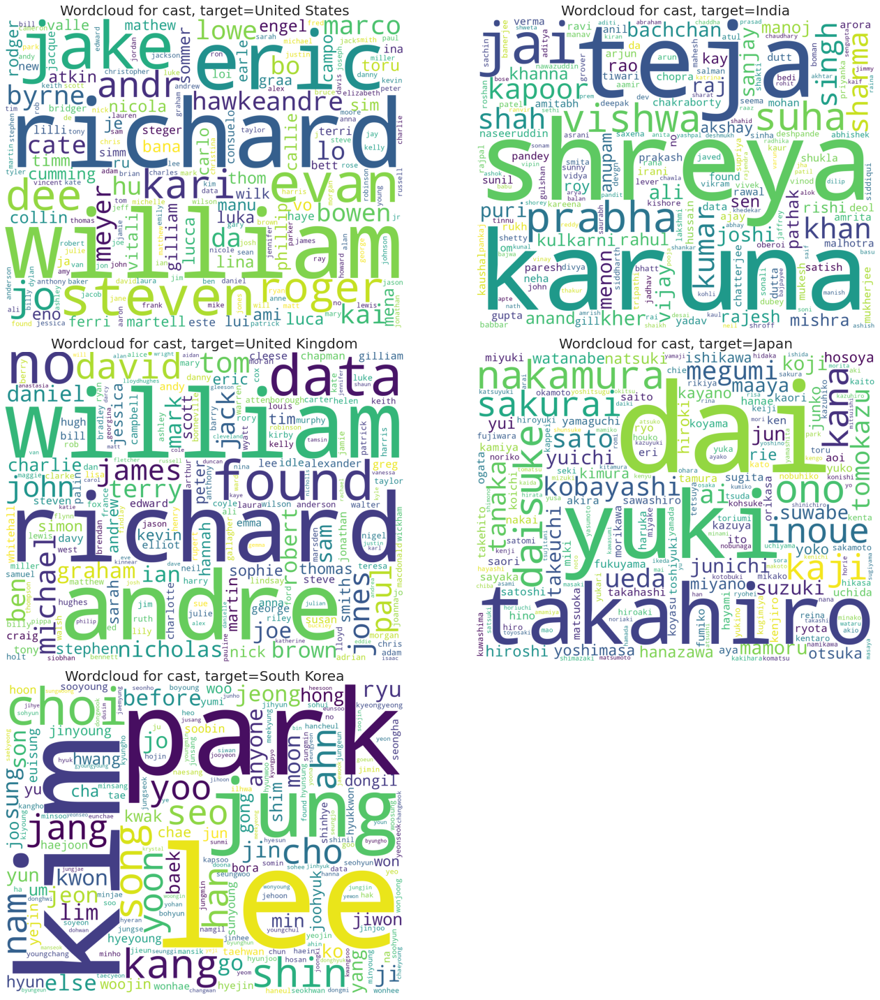

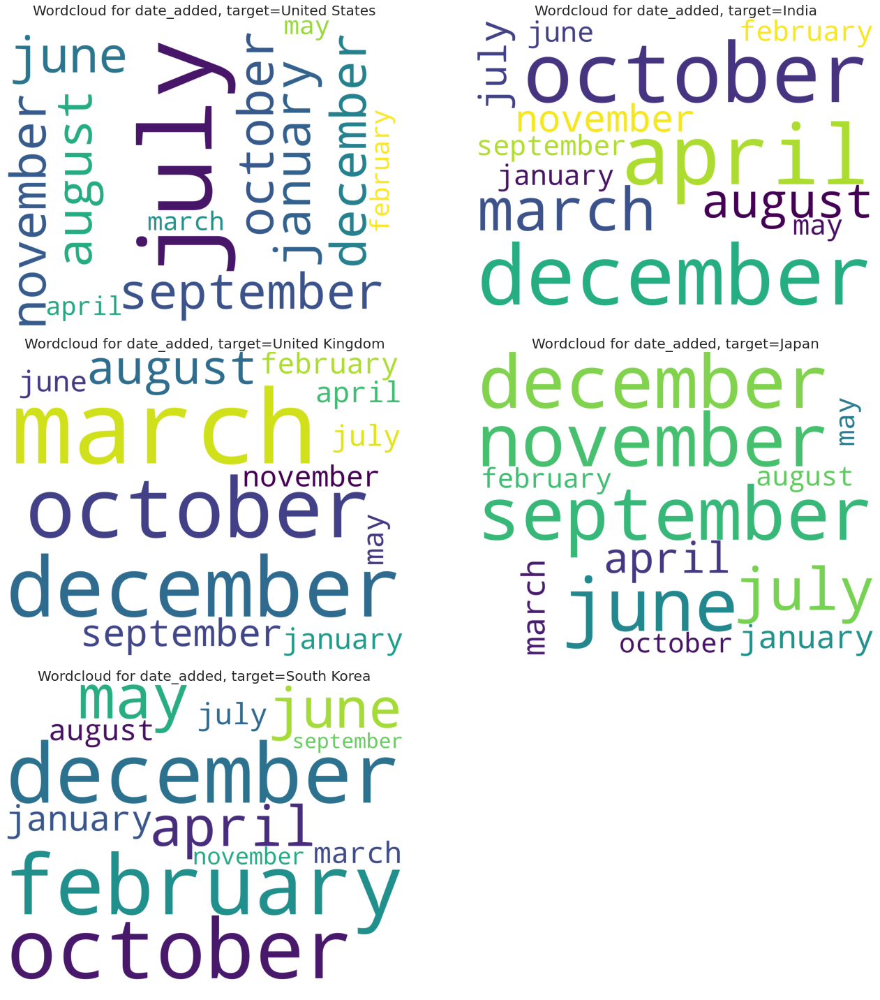

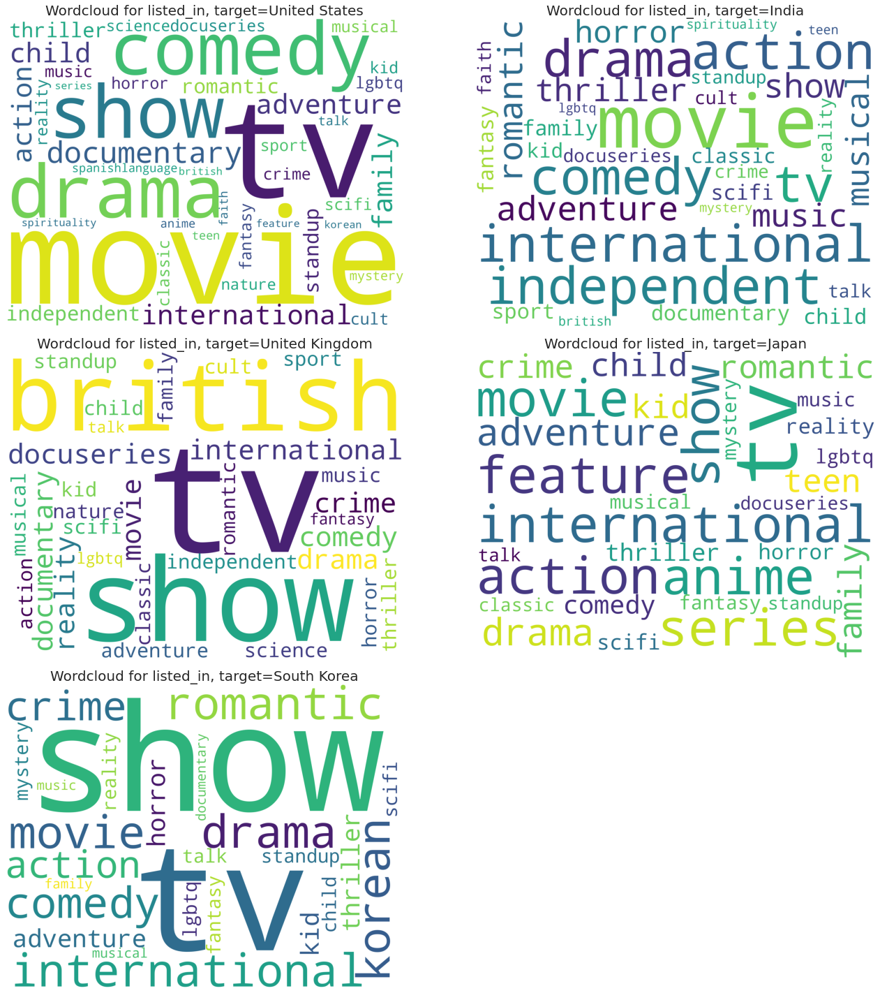

All Plots done
Time to run AutoViz = 219 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [107]:
# Here are the outputs:
'''
The AV object is created as an instance of the AutoViz_Class() class. The AutoViz() method is then called on this object to generate visualizations of the dfte DataFrame.

Here's what each of the arguments in the AutoViz() method do:

filename="": This argument is used to specify the name of the input file, if any. Since we're passing in a DataFrame directly, we don't need to specify a file name.
sep=',': This argument is used to specify the delimiter used in the input file, if any. Since we're passing in a DataFrame directly, we don't need to specify a delimiter. The default value for sep is ',' (comma), which is the most common delimiter used in CSV files.
depVar=target: This argument is used to specify the target variable (i.e., the variable that we want to predict) for the analysis. In this case, target is a variable that contains the name of the target variable.
dfte=dfte: This argument is used to specify the input DataFrame that we want to analyze.
header=0: This argument is used to specify whether the input file contains a header row. Since we're passing in a DataFrame directly, we don't need to specify this argument.
verbose=1: This argument is used to control the verbosity of the output. A value of 1 means that more verbose output will be generated.
lowess=False: This argument is used to specify whether to use lowess smoothing when generating scatter plots. A value of False means that lowess smoothing will not be used.
chart_format='png': This argument is used to specify the format of the output charts. In this case, we're specifying that we want the charts to be in PNG format.
max_rows_analyzed=150000: This argument is used to specify the maximum number of rows to analyze in the input DataFrame. In this case, we're specifying that we want to analyze up to 150,000 rows.
max_cols_analyzed=30: This argument is used to specify the maximum number of columns to analyze in the input DataFrame. In this case, we're specifying that we want to analyze up to 30 columns.
save_plot_dir=None: This argument is used to specify the directory where the output charts should be saved. In this case, we're specifying that we don't want to save the charts to a directory.

'''
AV = AutoViz_Class()
dft = AV.AutoViz(filename="", sep=',', depVar=target, dfte=dfte, 
               header=0, verbose=1, lowess=False,
               chart_format='png',max_rows_analyzed=150000,
           max_cols_analyzed=30, save_plot_dir=None)

<!-- SPEAKING NOTES FOR PRESENTATION:  -->
By examining the "Distribution of duration" plot, we can see that movies and TV shows with a duration of up to 1000 minutes are the most common. Additionally, it appears that not many TV shows have more than a few seasons. Analyzing the "Distribution of type" plot (showing the top 15 categories only), we can observe that the top two countries for movies are the United States and India, while for TV shows, they are the United States and the United Kingdom. 

Looking at South Korea as an example, we can gain insights into Netflix's content strategy by analyzing the "Distribution of Rating" diagram and "Distribution of Types" plot. It's clear that Netflix places a strong emphasis on TV shows and content rated 'TV-MA' (for adults) and 'TV-14' (for teens aged 14 and above). This can be observed from the content they offer and the ratings they receive. For instance, 'PHYSICAL: 100' is a recent and highly popular Korean TV show that exemplifies this trend.


By examining the "Percentage Distribution of Target" plot, we can determine that the United States has the largest number of Netflix viewers, accounting for 67% of the total. Finally, after reviewing the time series plots for Netflix products in the United States, United Kingdom, India, and South Korea, we can speculate that the duration of future products will be longer.

One final point to mention is that the Autoviz package can also create a word cloud plot, similar to the one we created using the matplotlib library at the end of the second class.

While the current data frame may not include information on the number of clicks, we can gather such data in the future to evaluate the effectiveness of Netflix's content strategy more comprehensively. By analyzing how audiences engage with the content in terms of clicks and views, we can gain a better understanding of their preferences and tailor our analysis accordingly. This will enable us to refine our insights and make more informed recommendations on future content strategies.
